# IMPORT ALL NECESSARY LIBRARIES


In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
import tensorflow as tf
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.preprocessing import image
from keras.models import load_model
from sklearn.metrics import f1_score,confusion_matrix ,classification_report
from keras.callbacks import CSVLogger


# PRINTING THE DATASET INFORMATION

In [2]:
path = 'E:\Downloads\images'

data = pd.DataFrame({
    'Fruit/Vegetable': ['apple', 'banana', 'orange', 'tomato', 'guava', 'lemon', 'brinjal', 'chillies', 'cucumber', 'pepper', 'potato'],
    'fresh': np.zeros(11,dtype=int),
    'medium': np.zeros(11,dtype=int),
    'rotten': np.zeros(11,dtype=int)
})

for folder in os.listdir(path):
  path1=os.path.join(path,folder)
  for f in os.listdir(path1):
    path2=os.path.join(path1,f)
    name=f.split()[1]
    if  name in data['Fruit/Vegetable'].values:
      index = data.index[data['Fruit/Vegetable'] == name][0]
      data.at[index, f.split()[0]]+=len(os.listdir(path2))

data


,Fruit/Vegetable,fresh,medium,rotten
0,apple,4082,2975,2785
1,banana,2530,899,1999
2,orange,2335,1287,1988
3,tomato,4261,4715,859
4,guava,768,1696,773
5,lemon,2281,2881,4033
6,brinjal,999,1237,528
7,chillies,1083,417,805
8,cucumber,775,857,682
9,pepper,2478,927,980


In [3]:
data[['fresh','medium','rotten']].sum() #SUM OF EACH CATEGORY IN TOTAL

fresh     23707
medium    18862
rotten    16512
dtype: int64

In [4]:
TRAIN_PATH=r'E:\Downloads\images\train'
X=[]
labels=[]
# add the first image for each category for plotting
for folder in os.listdir(TRAIN_PATH):
  path= os.path.join(TRAIN_PATH,folder)
  img= cv2.imread(os.path.join(path,os.listdir(path)[0]))
  img= cv2.resize(img, (200,200))
  img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  X.append(img)
  labels.append(folder)



In [5]:
X=np.array(X) # check sizes
X.shape

(33, 200, 200, 3)

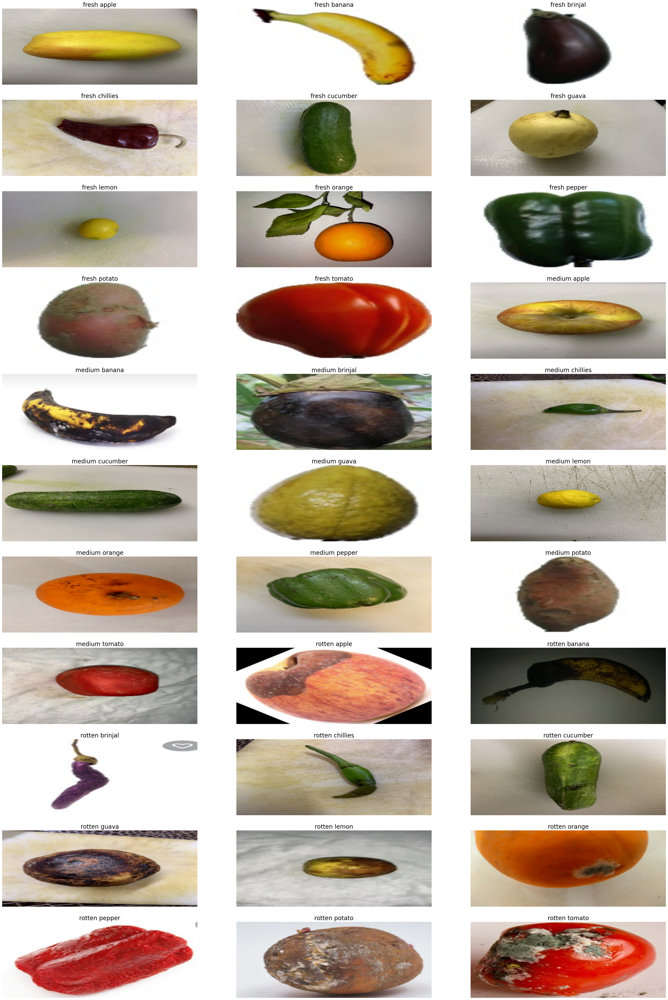

In [19]:
#plot an image of each fruit in each category


f, ax= plt.subplots(11,3, figsize=(40,60))
for i, img in enumerate(X):
  ax[i // 3][i % 3].imshow(img,aspect='auto')
  ax[i // 3][i % 3].set_title(labels[i],size=20)
  ax[i // 3][i % 3].axis('off')


# DATA PREPROCESSING

In [2]:

# Create data generators for train and test
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Rescale pixel values to 0, 1
    validation_split=0.2 # 20% for validation
)

test_datagen = ImageDataGenerator(rescale=1.0/255.0)
path= r'images'

# Load and preprocess the training data
train_generator = train_datagen.flow_from_directory(
    os.path.join(path, 'train'),
    target_size=(224, 224),  # image size of 224 for VGG16
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

# validation data
validation_generator = train_datagen.flow_from_directory(
    os.path.join(path, 'train'),
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'  
)

#testing data
test_generator = test_datagen.flow_from_directory(
    os.path.join(path, 'test'),
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 33388 images belonging to 33 classes.
Found 8332 images belonging to 33 classes.
Found 18336 images belonging to 33 classes.


# VGG16

In [7]:
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)) # pretrained model

# freeze learnable layers
for layer in vgg16.layers:
    layer.trainable = False

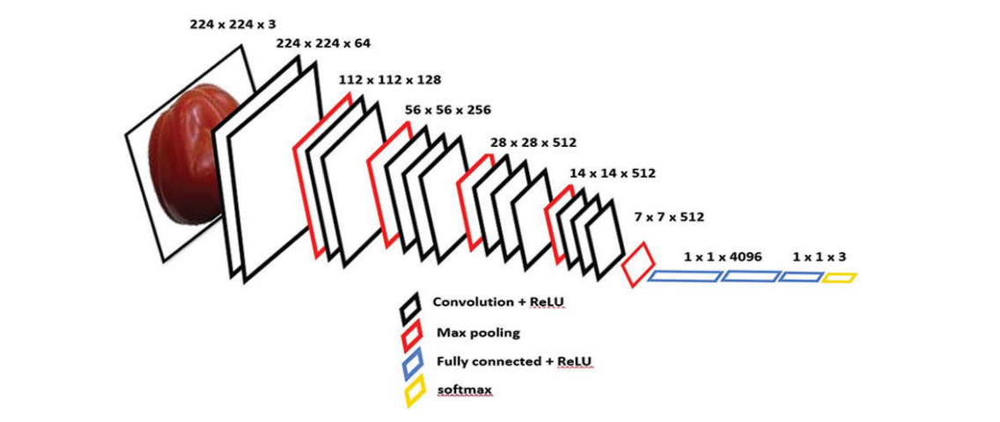))

In [8]:
vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

## CREATE THE MODEL

In [9]:

model= Sequential()
model.add(vgg16) # add the predefined VGG16 architecture 
model.add(Flatten())
model.add(Dense(128, activation='relu')) # relu as activation function
model.add(Dropout(0.2)) # for regularization and avoiding overfitting
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(33, activation='softmax', name='type')) # outputs 33 classes


#compile
model.compile(optimizer=Adam(learning_rate=0.0001), # Adam is the gradient decent alg , it uses SGD 'stochastic gradient descent'
              loss='categorical_crossentropy', # the loss function used for finding error ,  
              metrics=['acc'])

csv_logger = CSVLogger('training.log', separator=',', append=False) # to save the model metrics in a log file 

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 type (Dense)                (None, 33)                2

## TRAIN THE MODEL

In [11]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=15,
    callbacks=[csv_logger]
)

Epoch 1/15
1044/1044 [==============================] - 2513s 2s/step - loss: 1.2720 - acc: 0.6466 - val_loss: 0.6543 - val_acc: 0.7969
Epoch 2/15
1044/1044 [==============================] - 2284s 2s/step - loss: 0.5235 - acc: 0.8497 - val_loss: 0.4659 - val_acc: 0.8460
Epoch 3/15
1044/1044 [==============================] - 2262s 2s/step - loss: 0.3493 - acc: 0.8973 - val_loss: 0.4111 - val_acc: 0.8595
Epoch 4/15
1044/1044 [==============================] - 2247s 2s/step - loss: 0.2546 - acc: 0.9247 - val_loss: 0.3943 - val_acc: 0.8656
Epoch 5/15
1044/1044 [==============================] - 2293s 2s/step - loss: 0.2075 - acc: 0.9366 - val_loss: 0.3885 - val_acc: 0.8748
Epoch 6/15
1044/1044 [==============================] - 2257s 2s/step - loss: 0.1673 - acc: 0.9492 - val_loss: 0.3833 - val_acc: 0.8721
Epoch 7/15
1044/1044 [==============================] - 2290s 2s/step - loss: 0.1335 - acc: 0.9589 - val_loss: 0.3370 - val_acc: 0.8860
Epoch 8/15
1044/1044 [==========================

In [12]:
model.save('entire_model1.h5') # save the trained model to a file so we dont have to retrain after closing the project

## ACCURACY AND VALIDATION PLOTS

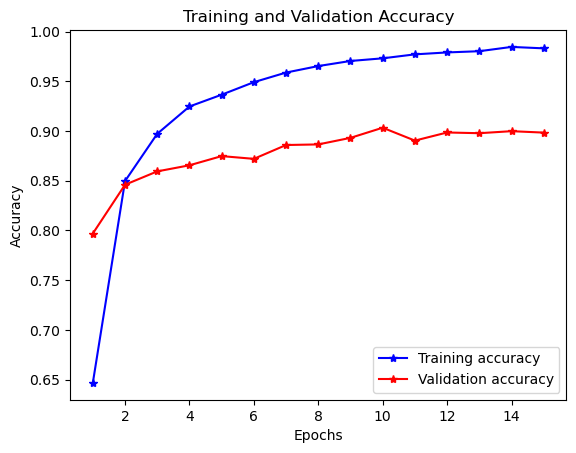

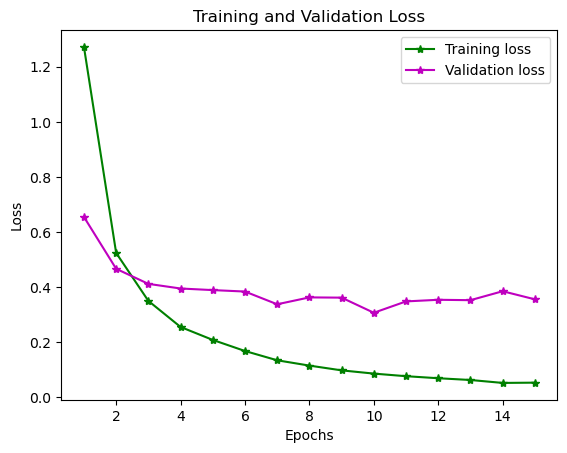

In [13]:
train_acc = history.history['acc']
train_loss = history.history['loss']
val_acc = history.history['val_acc']  
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_acc, 'b*-', label='Training accuracy')
plt.plot(epochs, val_acc, 'r*-', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.figure()
# Plot Training and Validation Loss on the same plot
plt.plot(epochs, train_loss, 'g*-', label='Training loss')
plt.plot(epochs, val_loss, 'm*-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

# EVALUATE THE MODEL

In [14]:
predictions = model.predict(test_generator) # run the model on the test set
np.save('predictions.npy',predictions)# save the predictions array to a file for faster usage


573/573 [==============================] - 976s 2s/step


# LOADED MODEL

In [18]:
model= load_model('entire_model.h5') # the trained model
predictions = np.load('predictions.npy') # the predictions 
history = pd.read_csv('training.log.txt') # the model metrics history as a data frame

In [19]:
history.head()

,epoch,acc,loss,val_acc,val_loss
0,0,0.646640,1.272019,0.796928,0.654294
1,1,0.849706,0.523533,0.846015,0.465938
2,2,0.897268,0.349302,0.859457,0.411141
3,3,0.924733,0.254562,0.865578,0.394315
4,4,0.936594,0.207517,0.874820,0.388536


In [16]:
loss,acc = model.evaluate(test_generator)
print(f'Test accuracy: {acc}')
print(f'Test loss: {loss}')

573/573 [==============================] - 919s 2s/step - loss: 0.2140 - acc: 0.9458
Test accuracy: 0.9457896947860718
Test loss: 0.21402160823345184


In [4]:
# a function that calclates the error and the test accuracy and plot the confusion matrix and classification report
def predictor(test_gen,preds):  # takes the test set and the predictions array as arguments  
    y_pred= []
    y_true=test_gen.labels
    classes=list(test_gen.class_indices.keys()) # extract the labels 
    class_count=len(classes)
    errors=0
    tests=len(preds)    
    for i, p in enumerate(preds):        
        pred_index=np.argmax(p)         
        true_index=test_gen.labels[i]  # labels are integer values        
        if pred_index != true_index: # if a misclassification has occurred                                           
            errors=errors + 1 #count error
        y_pred.append(pred_index)
            
    acc=( 1-errors/tests) * 100 # calculate the accuracy
    print(f'there were {errors} errors in {tests} tests for an accuracy of {acc:6.2f}%') # print the test accuracy
    ypred=np.array(y_pred)
    ytrue=np.array(y_true)
    f1score=f1_score(ytrue, ypred, average='weighted')* 100 # f1 score
    cm = confusion_matrix(ytrue, ypred) # confusion matrix
    # plot the confusion matrix
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
    plt.xticks(np.arange(class_count)+.5, classes, rotation=90)
    plt.yticks(np.arange(class_count)+.5, classes, rotation=0)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes, digits= 4) # create classification report
    print("Classification Report:\n----------------------\n", clr)
    return acc,f1score,cm,clr 

there were 994 errors in 18336 tests for an accuracy of  94.58%


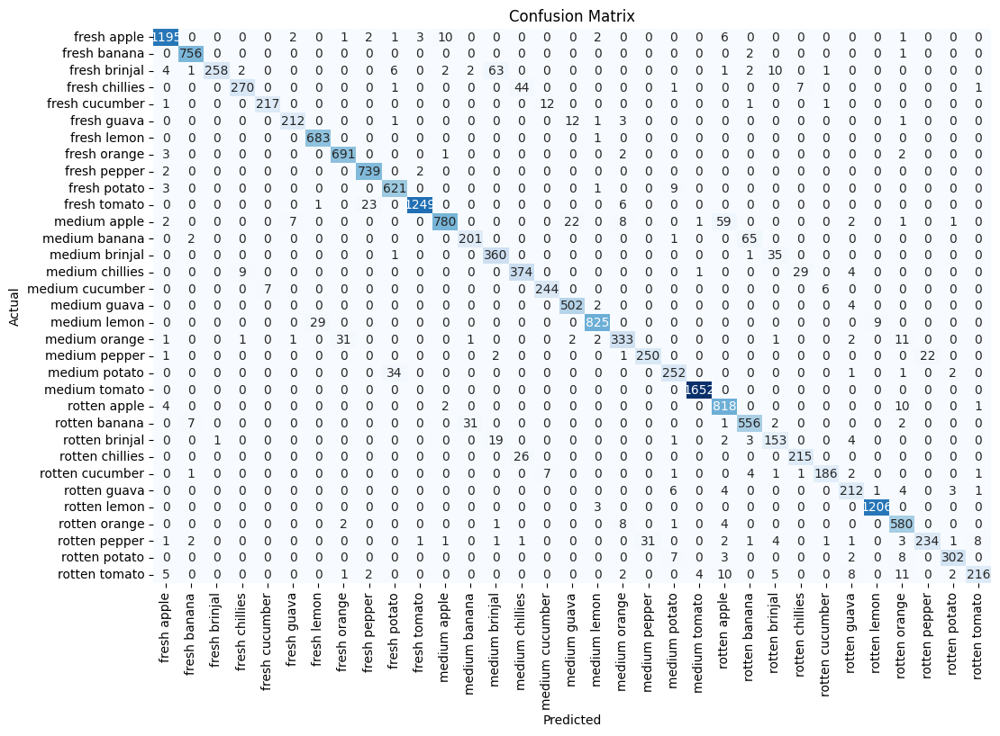

Classification Report:
----------------------
                  precision    recall  f1-score   support

    fresh apple     0.9779    0.9771    0.9775      1223
   fresh banana     0.9831    0.9960    0.9895       759
  fresh brinjal     0.9961    0.7330    0.8445       352
 fresh chillies     0.9574    0.8333    0.8911       324
 fresh cucumber     0.9688    0.9353    0.9518       232
    fresh guava     0.9550    0.9217    0.9381       230
    fresh lemon     0.9579    0.9985    0.9778       684
   fresh orange     0.9518    0.9886    0.9698       699
   fresh pepper     0.9648    0.9946    0.9795       743
   fresh potato     0.9338    0.9795    0.9561       634
   fresh tomato     0.9952    0.9765    0.9858      1279
   medium apple     0.9799    0.8834    0.9291       883
  medium banana     0.8553    0.7472    0.7976       269
 medium brinjal     0.8072    0.9068    0.8541       397
medium chillies     0.8404    0.8969    0.8677       417
medium cucumber     0.9278    0.9494    

In [7]:
acc,f1score,cm,clr=predictor(test_generator,predictions)

# TEST ON REAL LIFE DATA (not from the data set)

we took pictures of some fruits and vegetables ourselves and try to predict 

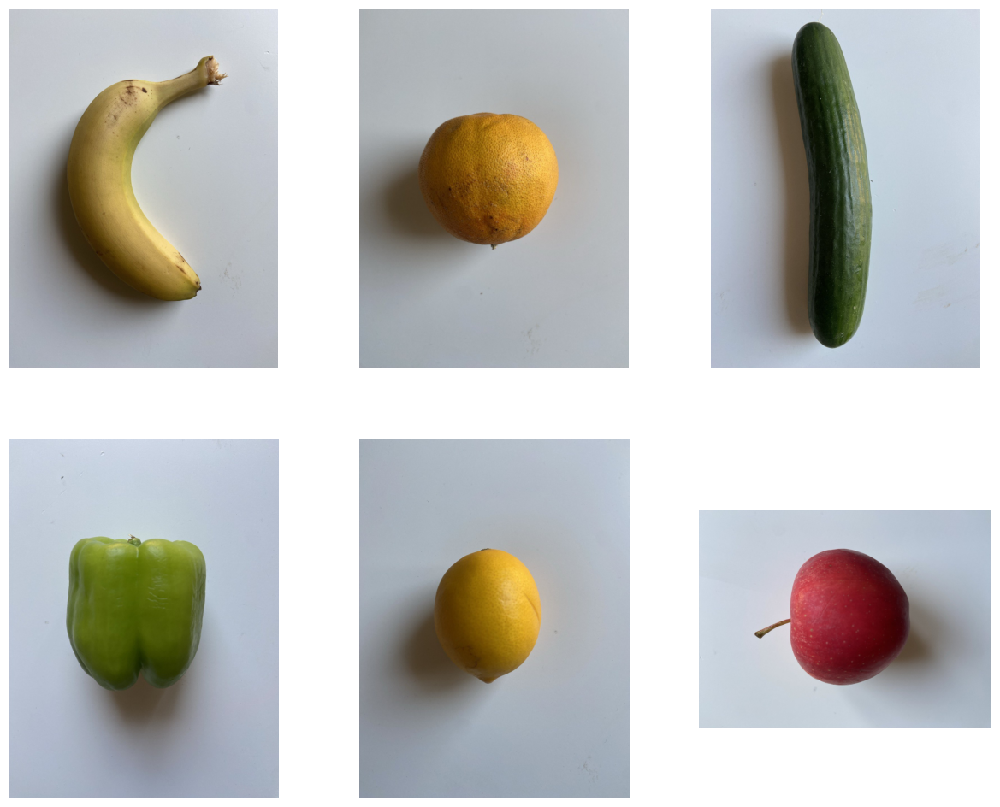

In [8]:
imgs=['test images/banana.jpg','test images/orange.jpg','test images/cucumber.jpg','test images/pepper.jpg','test images/lemon.jpg','test images/apple.jpg']
images=[]
for i in imgs:
    img=cv2.imread(i)
    img= cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    images.append(img)

plt.figure(figsize=(15, 12))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i])  
    plt.axis('off')
plt.show()


In [9]:
labels=[] # get the labels from the model predictions
for i in range(6):
    img=cv2.imread(imgs[i])
    img= cv2.resize(img,(224,224))
    img= np.array(img)
    img = np.expand_dims(img, axis=0)
    i=np.argmax(model.predict(img))
    labels.append(list(test_generator.class_indices.keys())[i])

1/1 [==============================] - 0s 288ms/step


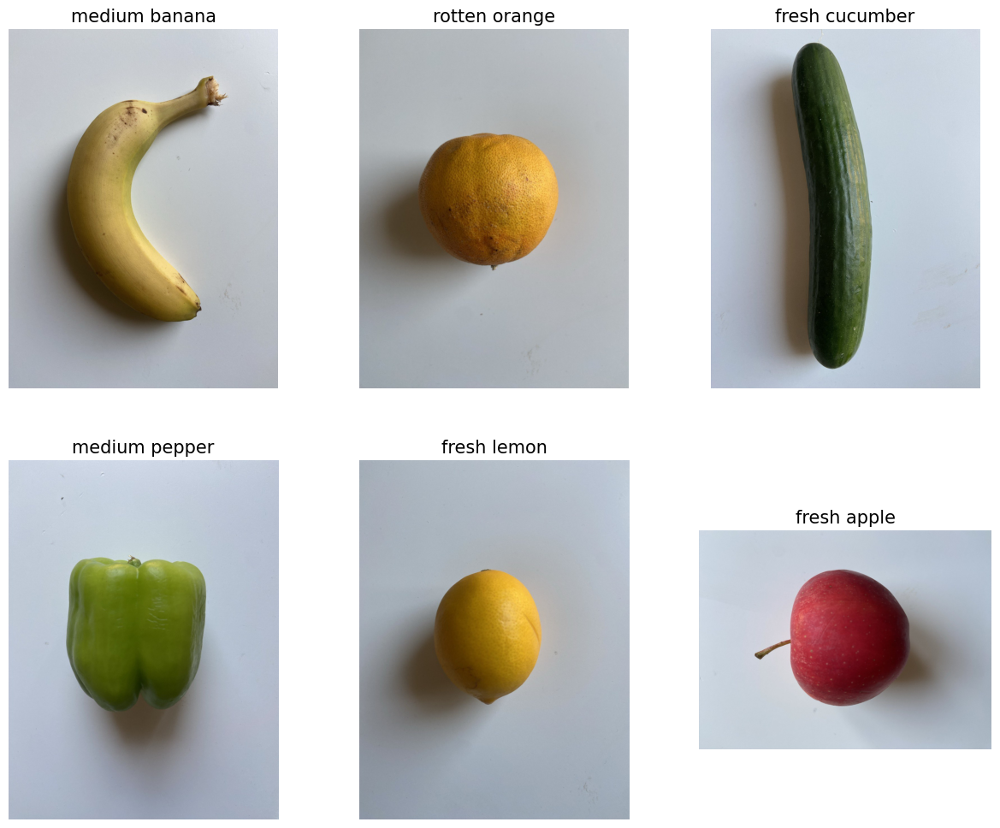

In [10]:
#plot the images with the predicted labels
plt.figure(figsize=(15, 12))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i])  
    plt.axis('off')
    plt.title(labels[i],size=15)

plt.show()